In [16]:
import numpy as np
from itertools import islice, cycle
import matplotlib.pyplot as plt
from matplotlib import animation, cm, colors
from IPython.display import HTML
from scipy._lib._util import check_random_state
%matplotlib inline

In [2]:
import imm

In [3]:
old_settings = np.geterr()

new_settings = old_settings.copy()
new_settings["divide"] = "raise"
new_settings["invalid"] = "raise"
new_settings["over"] = "ignore"
new_settings["under"] = "ignore"

np.seterr(**new_settings)
# np.seterr(**old_settings)

{'divide': 'warn', 'invalid': 'warn', 'over': 'warn', 'under': 'ignore'}

In [31]:
def plot_data(x_n, c_n, cmap=cm.get_cmap('gist_rainbow'), size=(10,10),
        seed=None):
    
    random_state = check_random_state(seed)
    
    unique, inverse = np.unique(c_n, return_inverse=True)
    rands = random_state.rand(len(unique))
    c = rands[inverse].reshape(c_n.shape)
    
    fig, ax = plt.subplots(figsize=size)
    
    scat = ax.scatter(x_n[:, 0], x_n[:, 1])
    
    scat.set_array(c)
    scat.set_cmap(cmap)
    # scat.set_norm(colors.Normalize(vmin=rands.min(), vmax=rands.max()))
    scat.set_norm(colors.Normalize(vmin=0, vmax=1))
    scat.set_linewidth(0)

In [5]:
from tempfile import NamedTemporaryFile

VIDEO_TAG = """<video controls>
 <source src="data:video/x-webm;base64,{0}" type="video/webm">
 Your browser does not support the video tag.
</video>"""

def anim_to_html(anim):
    if not hasattr(anim, '_encoded_video'):
        with NamedTemporaryFile(suffix='.webm') as f:
            anim.save(f.name, fps=6, extra_args=['-vcodec', 'libvpx'])
            video = open(f.name, "rb").read()
        anim._encoded_video = video.encode("base64")

    return VIDEO_TAG.format(anim._encoded_video)

In [23]:
def anim_data(x_n, c_n, cmap=cm.get_cmap('gist_rainbow'), size=(10,10),
        seed=None):
    
    random_state = check_random_state(seed)
    
    c_n = np.asarray(c_n, dtype=int)
    
    if c_n.ndim == 0:
        c_n = c_n[np.newaxis, np.newaxis]
    elif c_n.ndim == 1:
        c_n = c_n[np.newaxis, :]
    elif c_n.ndim > 2:
        raise ValueError
    
    numframes, n = c_n.shape
    
    unique, inverse = np.unique(c_n, return_inverse=True)
    rands = random_state.rand(len(unique))
    c = rands[inverse].reshape(c_n.shape)
    
    fig, ax = plt.subplots(figsize=size)
    scat = ax.scatter(x_n[:, 0], x_n[:, 1])
    
    def init():
        scat.set_array(c[0])
        scat.set_cmap(cmap)
        # scat.set_norm(colors.Normalize(vmin=rands.min(), vmax=rands.max()))
        scat.set_norm(colors.Normalize(vmin=0, vmax=1))
        scat.set_linewidth(0)
        return scat,
    
    def animate(i):
        scat.set_array(c[i])
        return scat,

    anim = animation.FuncAnimation(fig, animate, init_func=init,
                                   frames=range(1, numframes))

    plt.close(anim._fig)
    
    return HTML(anim_to_html(anim))

# Conjugate Gaussian Mixture

In [7]:
mm = imm.models.ConjugateGaussianMixture(
        xi=[0.,0.],
        rho=.1,
        beta=2.5,
        W=[[1.5,.5],[.5,1.5]])

# Dirichlet Process

In [37]:
pm = imm.models.DP(mm, alpha=.5, seed=4)

In [38]:
x_n, c_n = pm.draw(size=500)

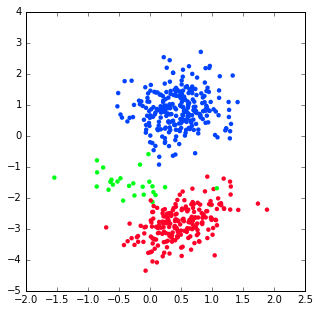

In [39]:
plot_data(x_n, c_n, size=(5,5), seed=1)

# Mixture of Finite Mixtures

In [55]:
# pm = imm.models.MFM(mm, gamma=1., mu=5., seed=4)
pm = imm.models.MFM(mm, gamma=1., mu=10., seed=2)

In [56]:
x_n, c_n = pm.draw(size=1000)

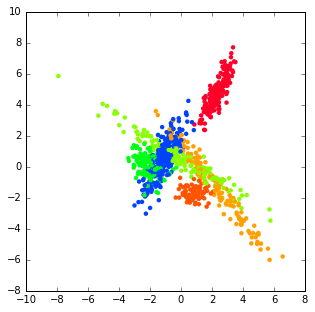

In [57]:
plot_data(x_n, c_n, size=(5,5), seed=1)

# Collapsed Gibbs Sampler

In [58]:
s = imm.samplers.CollapsedGibbsSampler(pm, max_iter=1000)

In [59]:
c_n_gibbs = pm.infer(x_n, sampler=s)

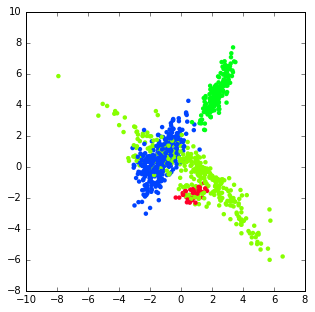

In [60]:
plot_data(x_n, c_n_gibbs[-1], size=(5,5), seed=1)

In [61]:
anim_data(x_n, c_n_gibbs, seed=1)

# Collapsed Merge-Split Sampler

In [62]:
s = imm.samplers.CollapsedRGMSSampler(pm, max_iter=1000)

In [63]:
c_n_rgms = pm.infer(x_n, sampler=s)

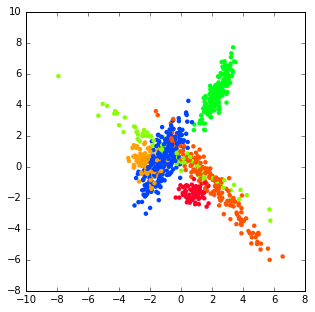

In [64]:
plot_data(x_n, c_n_rgms[-1], size=(5,5), seed=1)

In [65]:
anim_data(x_n, c_n_rgms, seed=1)

# Collapsed SAMS Sampler

In [66]:
s = imm.samplers.CollapsedSAMSSampler(pm, max_iter=1000)

In [67]:
c_n_sams = pm.infer(x_n, sampler=s)

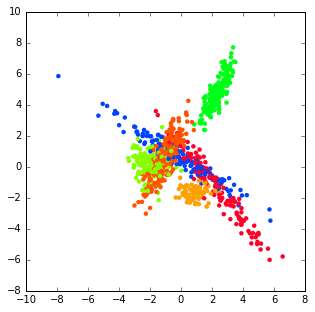

In [68]:
plot_data(x_n, c_n_sams[-1], size=(5,5), seed=1)

In [69]:
anim_data(x_n, c_n_sams, seed=1)